In [1]:
# Basic Libraries
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Data Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt

# Check for Outliers and Skewness(0 > log transform; 0.5 > square root transform)
from scipy.stats import zscore, boxcox

# Data Pre-processing
#ROC_AUC only handles binary 0,1 values. Using LabelBinarizer to convert y_test and y_pred
from sklearn.preprocessing import LabelEncoder, StandardScaler, LabelBinarizer
from sklearn.impute import SimpleImputer

# Model Training and Validation
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

#MultiOutput Regressor Model
from sklearn.multioutput import MultiOutputRegressor

# ML Algorithms
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Model Export
import joblib
from joblib import dump #from joblib import load > to load .pkl file

In [2]:
# https://archive.ics.uci.edu/ml/datasets/Bias+correction+of+numerical+prediction+model+temperature+forecast
df = pd.read_csv('Bias_correction_temperature_forecast.csv')
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [3]:
df.isna().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [4]:
df.loc[:,'LDAPS_CC1':].describe()

,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,0.368774,0.356080,0.318404,0.299191,0.591995,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,0.262458,0.258061,0.250362,0.254348,1.945768,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,0.146654,0.140615,0.101388,0.081532,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,0.315697,0.312421,0.262555,0.227664,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,0.575489,0.558694,0.496703,0.499489,0.052525,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


Observations:
    1. Missing values found for most of the features.
    2. Most values in 'LDAPS_PPT1', 'LDAPS_PPT2' and 'LDAPS_PPT3' is 0
    3. Skewness found in few features of the dataset.

In [5]:
for i in df.columns:
    if df[i].nunique() > 15:
        continue
    else:
        print('#######',i,'#######')
        print(df[i].unique())

####### lat #######
[37.6046 37.5776 37.645  37.5507 37.5102 37.4697 37.4967 37.4562 37.5372
 37.6181 37.4832 37.5237]


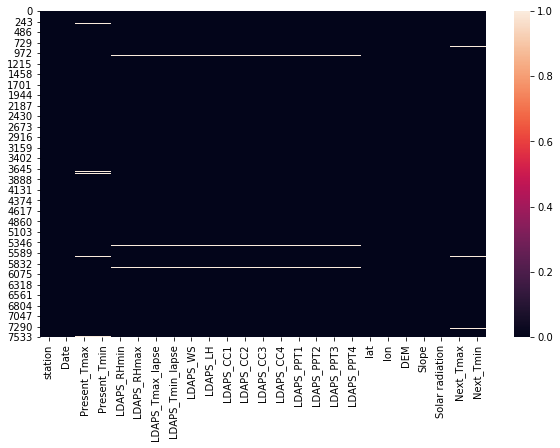

In [6]:
plt.figure(figsize=(10,6))
sns.heatmap(df.isna())

In [7]:
# Let's drop null values
print('Initial Shape ::', df.shape)
df.dropna(axis=0, how='any', inplace=True)
print('Final Shape ::', df.shape)

Initial Shape :: (7752, 25)
Final Shape :: (7588, 25)


In [62]:
df.index = range(0, 7588)

In [8]:
# Convert 'Date' from object to datetime format
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

In [9]:
cat_df, num_df = [], []
for i in df:
    if df[i].dtypes=='object':
        cat_df.append(i)
    elif (df[i].dtypes=='int') | (df[i].dtypes=='float') | (df[i].dtypes=='int64'):
        num_df.append(i)
    else: print('Others >', i)
print('>>> Total Number of Features ::', df.shape[1])
print('>>> Number of Categorical Features ::', len(cat_df))
print('>>> Number of Numerical Features ::', len(num_df))

Others > Date
>>> Total Number of Features :: 25
>>> Number of Categorical Features :: 0
>>> Number of Numerical Features :: 24


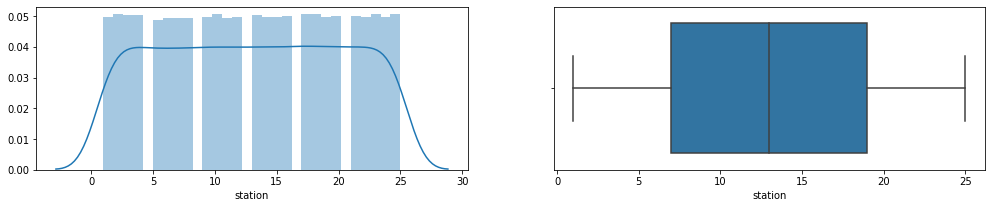

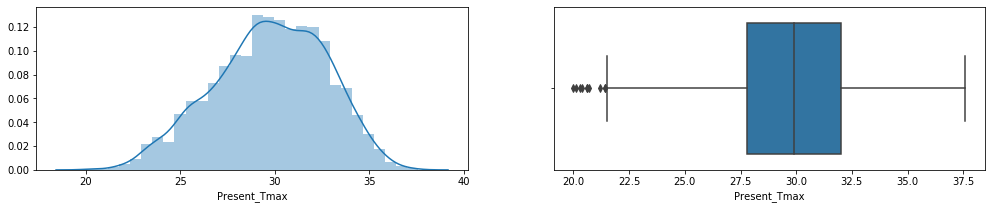

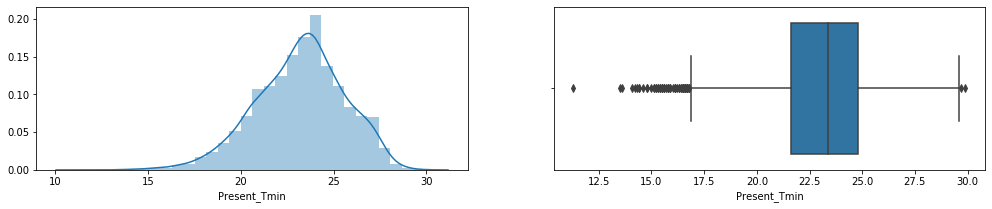

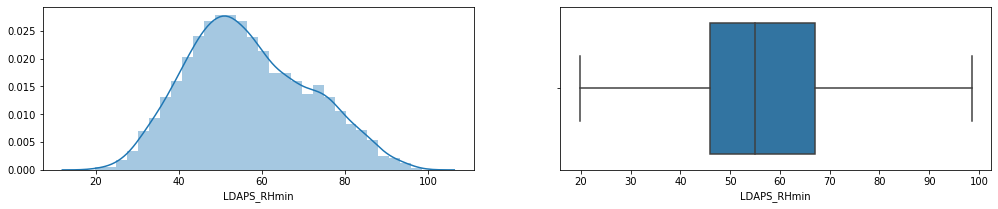

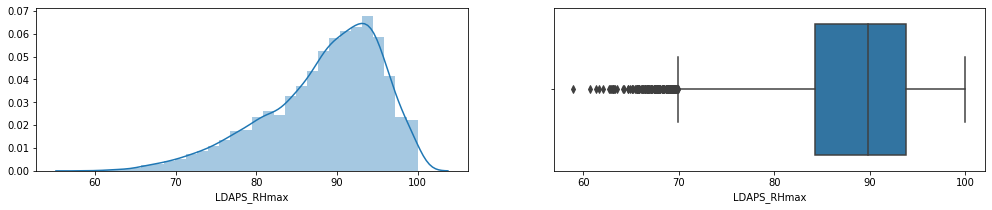

...

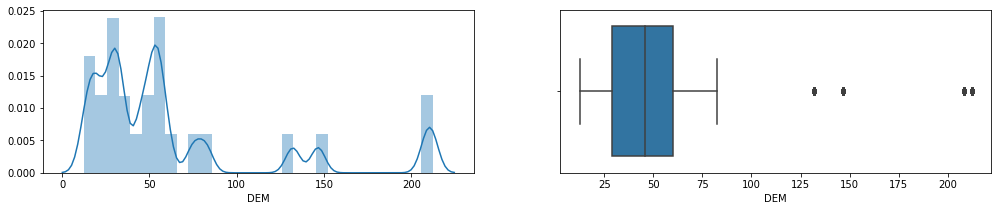

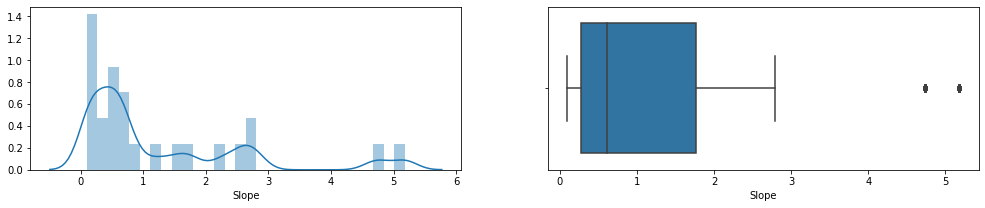

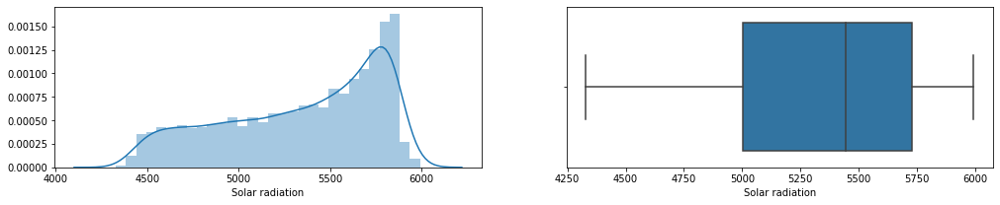

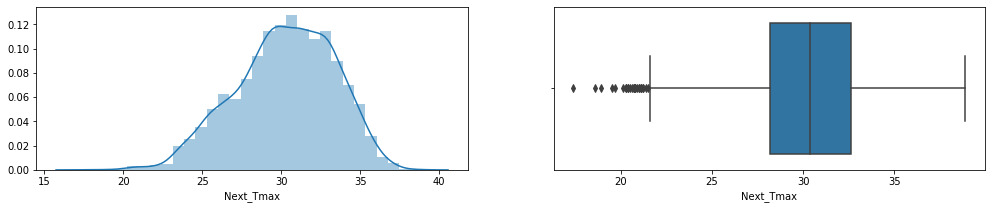

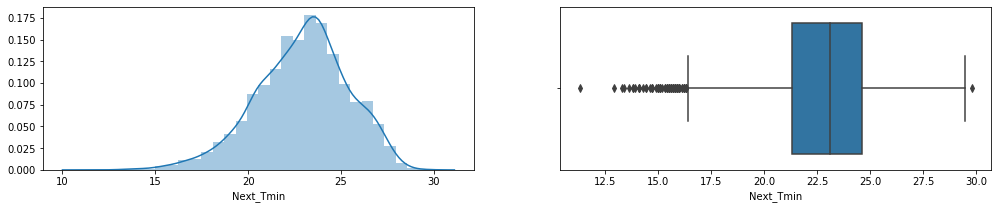

In [10]:
#Univariate analysis for num_df
skewness, skew_name = [], []
for i in num_df:
    f=plt.figure(figsize=(17,3))
    f.add_subplot(1,2,1)
    sns.distplot(df[i],bins=30)
    f.add_subplot(1,2,2)
    sns.boxplot(df[i])
    skewness.append(round(df[i].skew(),2))
    skew_name.append(i)

In [11]:
skew_df = pd.DataFrame(skewness, index=[skew_name], columns=['Skewness']).sort_values(by='Skewness', ascending=False)
skew_df[skew_df['Skewness'] > 0.55].T

,LDAPS_PPT4,LDAPS_PPT3,LDAPS_PPT2,LDAPS_PPT1,DEM,Slope,LDAPS_WS,LDAPS_CC4,LDAPS_LH,LDAPS_CC3
Skewness,6.68,6.36,5.71,5.31,1.72,1.56,1.55,0.66,0.66,0.64


As we can see, the data has lot of skewness. We will remove them with log transformation.

Observations:
    1. LDAPS_PPT1, LDAPS_PPT2, LDAPS_PPT3, LDAPS_CC4 and LDAPS_CC3 have 0 values. We cannot perform log transformation.
    2. Since LDAPS_LH is negatively skewed, log10 transformation isn't an ideal option.

In [12]:
for i in ['DEM', 'Slope', 'LDAPS_WS']:
    df['Log_'+ i] = np.log10(df[i])

In [13]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Log_DEM',
       'Log_Slope', 'Log_LDAPS_WS'],
      dtype='object')

In [14]:
for i in ['DEM', 'Slope', 'LDAPS_WS']:
    print('Skewness of', i, 'is', df[i].skew())
    print('>> Skewness of', ('Log_'+ i), 'is', df['Log_'+ i].skew())

Skewness of DEM is 1.7216166816077285
>> Skewness of Log_DEM is 0.4097979513497496
Skewness of Slope is 1.5590502641157087
>> Skewness of Log_Slope is 0.0626788888083007
Skewness of LDAPS_WS is 1.5539261125674748
>> Skewness of Log_LDAPS_WS is 0.5771197971647111


In [64]:
df['Date_Year'], df['Date_Month'], df['Date_Day'] = np.nan, np.nan, np.nan

for i, j in enumerate(df['Date']):
    df['Date_Year'][i] = j.year
    df['Date_Month'][i] = j.month
    df['Date_Day'][i] = j.day

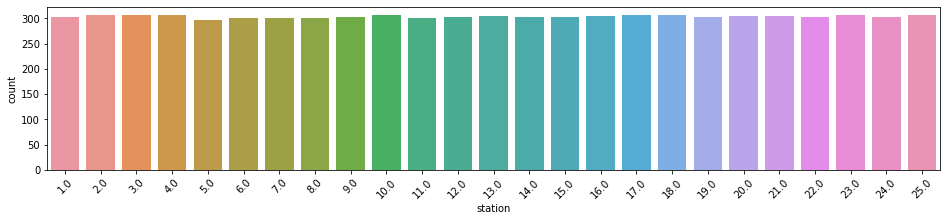

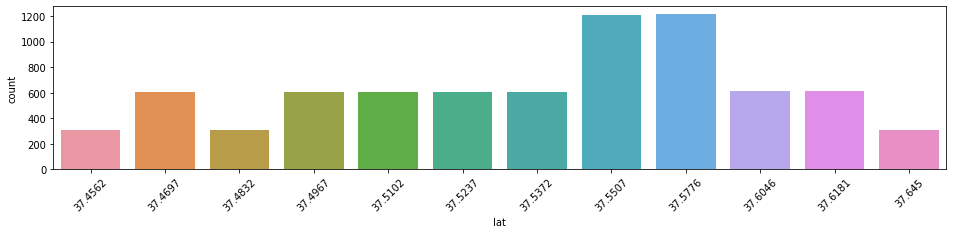

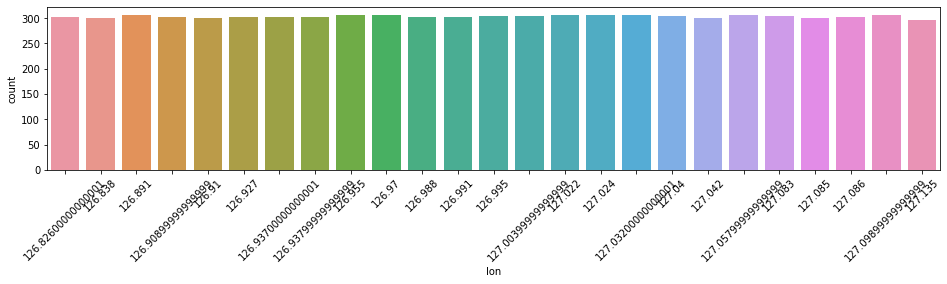

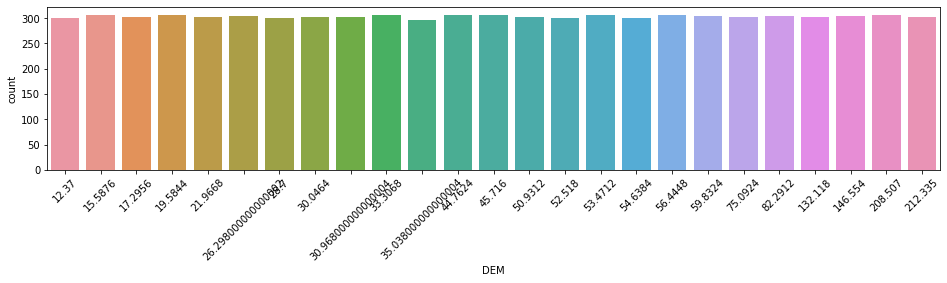

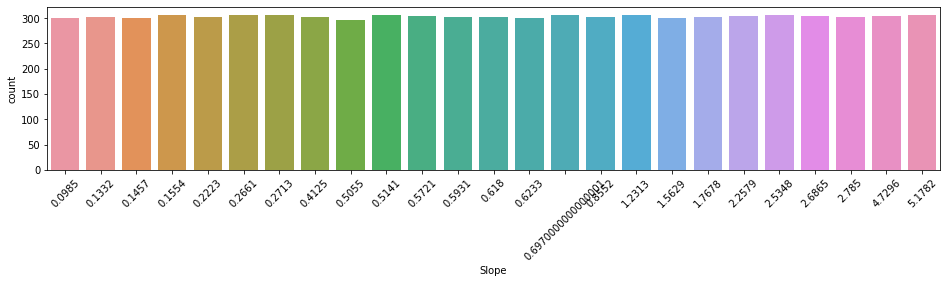

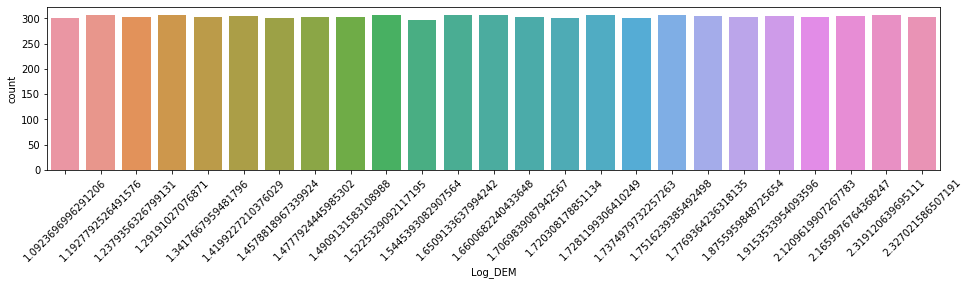

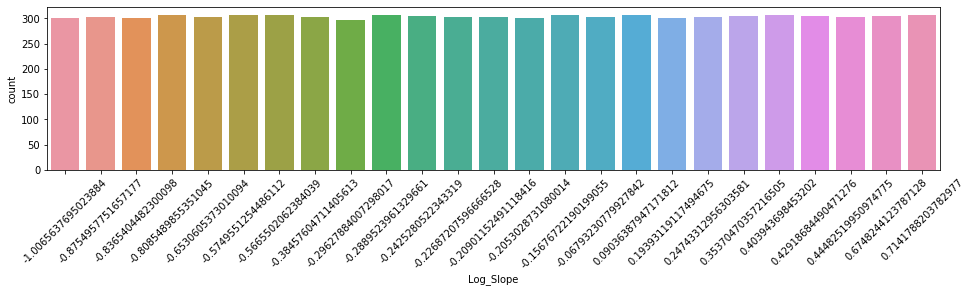

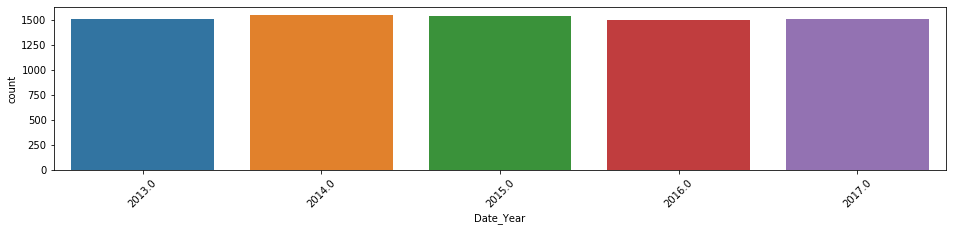

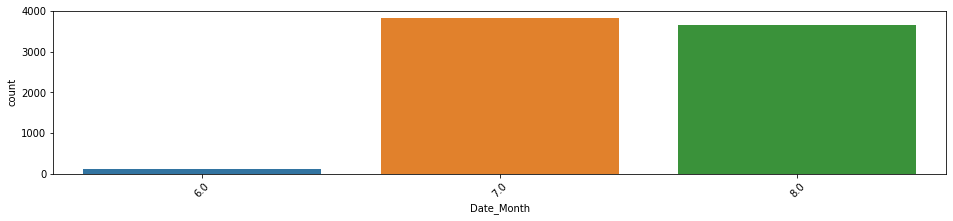

In [67]:
for i in df:
    if df[i].nunique() < 30:
        plt.figure(figsize=(16,3))
        plt.xticks(rotation=45)
        sns.countplot(df[i])
    else: continue

Observations:
    1. Majority of the data is equally distributed between its values.
    2. Data is only from June, July and August.
    3. Very few data available for June compared to July and August.

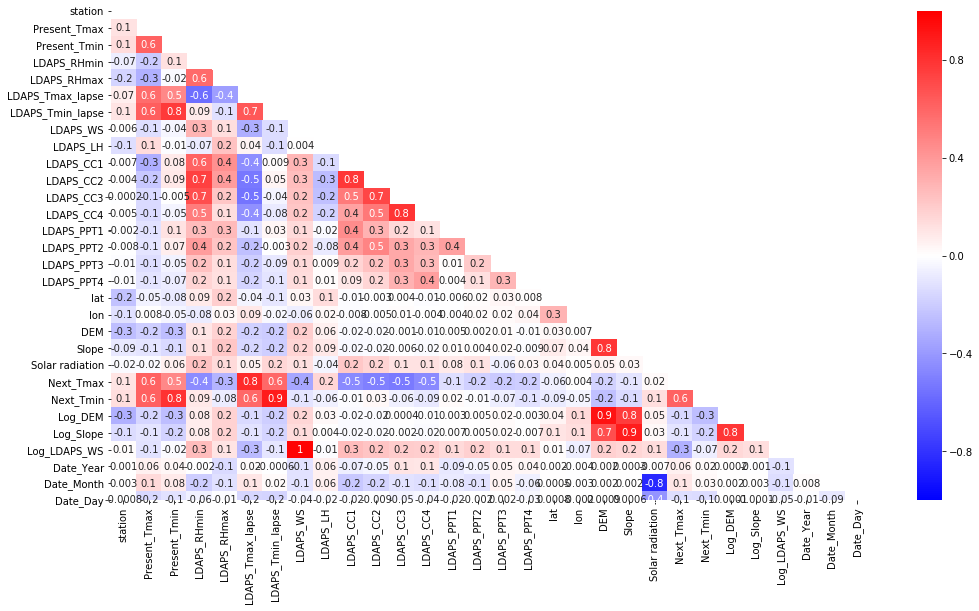

In [73]:
plt.figure(figsize=(17,9))
sns.heatmap(df.corr(), vmax=1, vmin=-1, annot= True, fmt='.1g', cmap='bwr', mask=np.triu(df.corr()))

Observations:
    1. Next_Tmax and Next_Tmin is highly and positively correlated with Present_Tmax, Present_Tmin, LDAPS_Tmax_lapse and LDAPS_Tmin_lapse.
    2. Solar radiation and Date_Month is highly -vely correlated.
    3. LDAPS_CC1, LDAPS_CC2, LDAPS_CC3, LDAPS_CC4 are positively and highly correlated.
    4. LDAPS_CC's are higly -vely correlated with LDAPS_Tmax_lapse.

In [74]:
df.drop(columns=['DEM', 'Slope', 'LDAPS_WS'], axis=1, inplace=True)

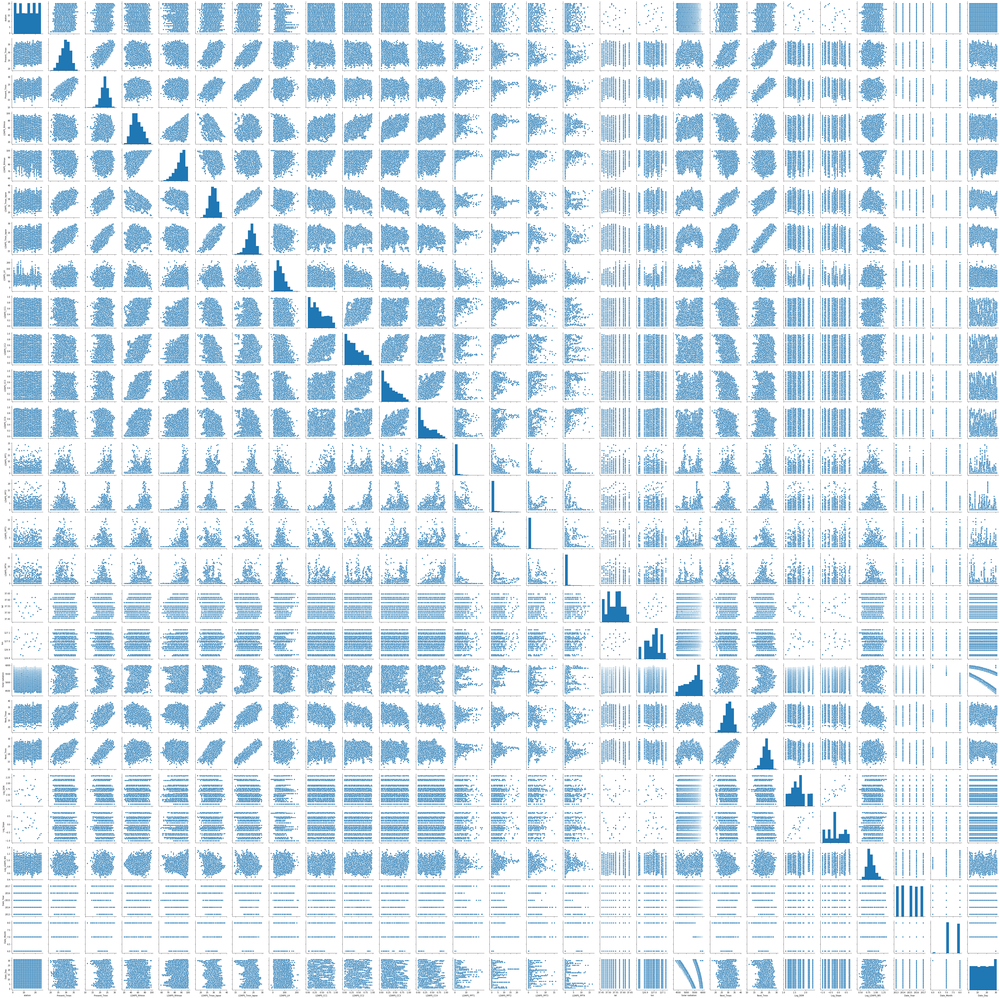

In [75]:
sns.pairplot(df)

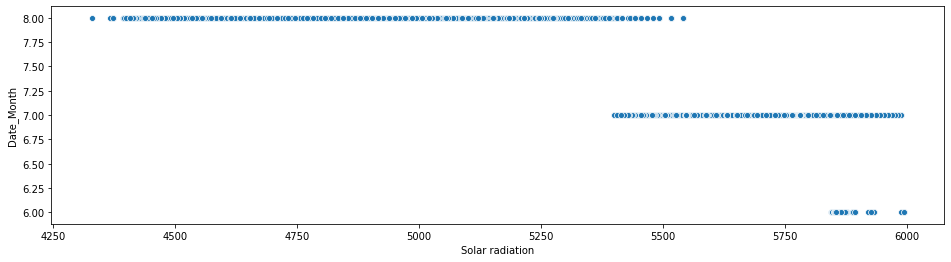

In [80]:
# Bivariate analysis
plt.figure(figsize=(16,4))
sns.scatterplot(x='Solar radiation', y='Date_Month', data=df)

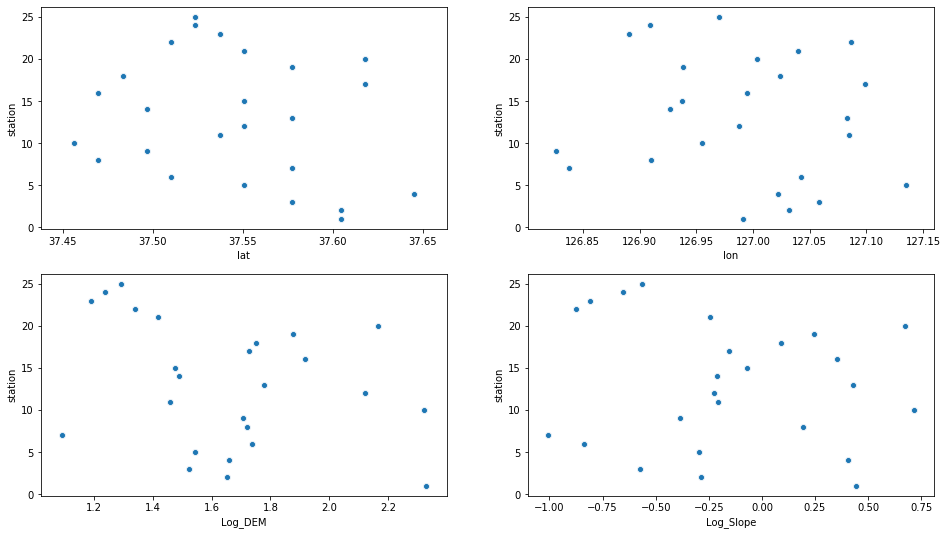

In [83]:
# Bivariate analysis
f=plt.figure(figsize=(16,9))
f.add_subplot(2,2,1)
sns.scatterplot(x='lat', y='station', data=df)
f.add_subplot(2,2,2)
sns.scatterplot(x='lon', y='station', data=df)
f.add_subplot(2,2,3)
sns.scatterplot(x='Log_DEM', y='station', data=df)
f.add_subplot(2,2,4)
sns.scatterplot(x='Log_Slope', y='station', data=df)

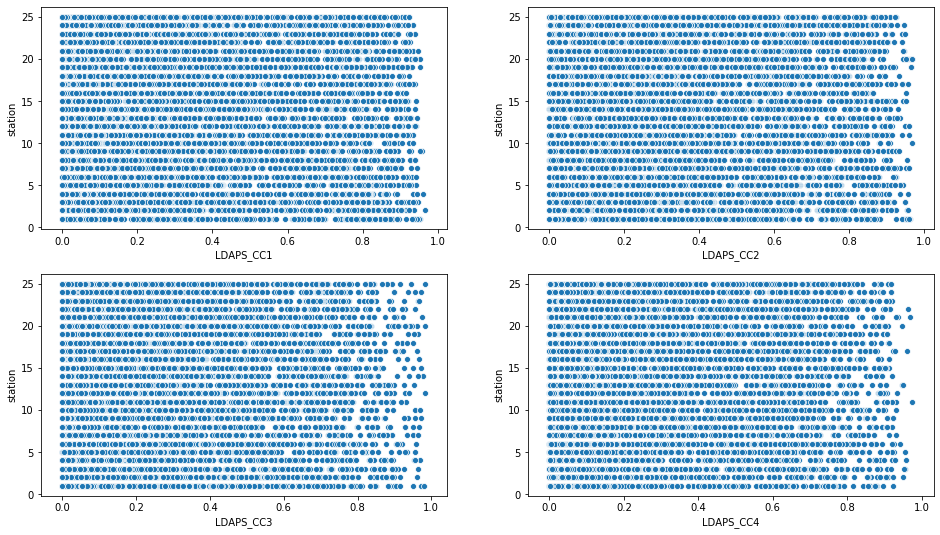

In [84]:
# Bivariate analysis
f=plt.figure(figsize=(16,9))
f.add_subplot(2,2,1)
sns.scatterplot(x='LDAPS_CC1', y='station', data=df)
f.add_subplot(2,2,2)
sns.scatterplot(x='LDAPS_CC2', y='station', data=df)
f.add_subplot(2,2,3)
sns.scatterplot(x='LDAPS_CC3', y='station', data=df)
f.add_subplot(2,2,4)
sns.scatterplot(x='LDAPS_CC4', y='station', data=df)

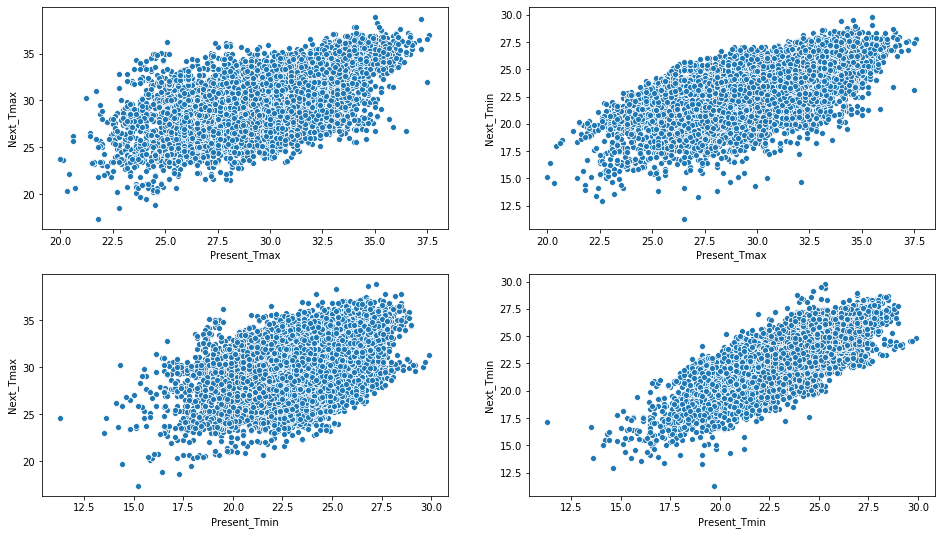

In [85]:
# Bivariate analysis
f=plt.figure(figsize=(16,9))
f.add_subplot(2,2,1)
sns.scatterplot(x='Present_Tmax', y='Next_Tmax', data=df)
f.add_subplot(2,2,2)
sns.scatterplot(x='Present_Tmax', y='Next_Tmin', data=df)
f.add_subplot(2,2,3)
sns.scatterplot(x='Present_Tmin', y='Next_Tmax', data=df)
f.add_subplot(2,2,4)
sns.scatterplot(x='Present_Tmin', y='Next_Tmin', data=df)

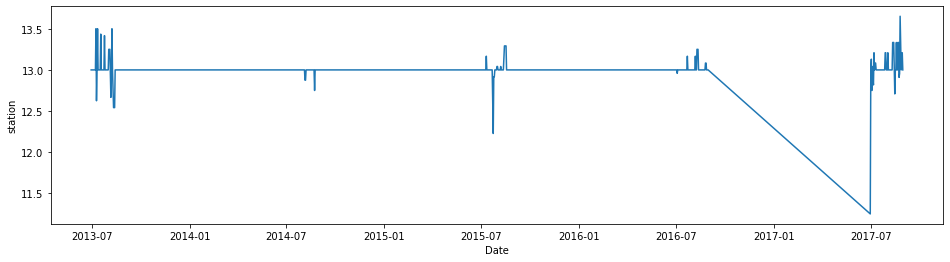

In [96]:
# Bivariate analysis
plt.figure(figsize=(16,4))
sns.lineplot(x='Date', y='station', data=df, ci=None)

In [97]:
df.drop(columns=['Date'], axis=1, inplace=True)

In [99]:
x=df.drop(columns=['Next_Tmax', 'Next_Tmin'], axis=1)
y=pd.concat([df['Next_Tmax'], df['Next_Tmin']], axis=1)

In [100]:
# Instantiate and scale the data
ss=StandardScaler()
x=ss.fit_transform(x)

# Machine Learning Algorithms

In [112]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)
print('x_train.shape -->',x_train.shape,'| x_test.shape -->',x_test.shape,'\ny_train.shape -->',y_train.shape,'| y_test.shape -->',y_test.shape)

x_train.shape --> (6070, 25) | x_test.shape --> (1518, 25) 
y_train.shape --> (6070, 2) | y_test.shape --> (1518, 2)


In [113]:
#Creating function for Model Training
def models(model, x_train, x_test, y_train, y_test, score, rmse):
    #Fit the algorithm on the data
    model.fit(x_train, y_train)
    
    #Predict training set:
    y_pred = model.predict(x_test)
    
    score.append(model.score(x_train, y_train)*100)
    rmse.append(np.sqrt(mean_squared_error(y_test, y_pred)))
    
    print('Accuracy Score :: %0.2f' %(model.score(x_train, y_train)*100))
    print('R2 Score:', r2_score(y_test, y_pred))
    print('>>> Error >>>')
    print('Mean Absolute Error:', mean_absolute_error(y_test, y_pred))
    print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
    print('Root Mean Squared Error:', np.sqrt(mean_squared_error(y_test, y_pred)))

In [114]:
# Instantiate all models
lreg = LinearRegression()
knr = KNeighborsRegressor()
rr = Ridge()
lr = Lasso()
enr = ElasticNet()
svr = MultiOutputRegressor(SVR())
dct = DecisionTreeRegressor()
rf = RandomForestRegressor()

In [115]:
all_models={'Linear Regression': lreg,
            'K-Neighbors Regressor': knr,
            'Ridge Regression': rr,
            'Lasso Regression': lr,
            'Elastic Net': enr,
            'Support Vector Regression': svr,
            'Decision Tree Regression': dct,
            'Random Forest Regressor': rf
           }

In [116]:
score,rmse = [],[]
for i, j in all_models.items():
    print('-------------------', i, '-------------------')
    models(j, x_train, x_test, y_train, y_test, score, rmse)

------------------- Linear Regression -------------------
Accuracy Score :: 81.02
R2 Score: 0.8023845692779403
>>> Error >>>
Mean Absolute Error: 0.9506511229466937
Mean Squared Error: 1.5836812971521579
Root Mean Squared Error: 1.2584439984171556
------------------- K-Neighbors Regressor -------------------
Accuracy Score :: 91.84
R2 Score: 0.8657803471352574
>>> Error >>>
Mean Absolute Error: 0.7805204216073766
Mean Squared Error: 1.0572660079051397
Root Mean Squared Error: 1.0282344129162084
------------------- Ridge Regression -------------------
Accuracy Score :: 81.02
R2 Score: 0.8023846480917101
>>> Error >>>
Mean Absolute Error: 0.9506404812541713
Mean Squared Error: 1.5836685451849402
Root Mean Squared Error: 1.2584389318456974
------------------- Lasso Regression -------------------
Accuracy Score :: 61.89
R2 Score: 0.604852083980548
>>> Error >>>
Mean Absolute Error: 1.3947407175651199
Mean Squared Error: 3.113707971749813
Root Mean Squared Error: 1.7645701946224222
--------

In [117]:
pd.DataFrame([all_models.keys(), score, rmse], index=['Model', 'Accuracy Score', 'RMSE']).T.sort_values(by='Accuracy Score', ascending=False)

,Model,Accuracy Score,RMSE
6,Decision Tree Regression,100,1.33635
7,Random Forest Regressor,98.6586,0.891188
1,K-Neighbors Regressor,91.8444,1.02823
5,Support Vector Regression,91.6564,0.951562
0,Linear Regression,81.023,1.25844
2,Ridge Regression,81.023,1.25844
4,Elastic Net,67.2326,1.64318
3,Lasso Regression,61.8928,1.76457


Conclusion:
    1. Lasso regression is the worst model with 61.89% accuracy.
    2. Ridge Regression and Lasso Regression did not improve the score from Linear Regression.
    3. Decision Tree Regression gained 100% accuracy and is the best model for this dataset.

In [118]:
#Exporting model as pkl file
joblib.dump(dct,'dct_Bias_correction_temperature_forecast.pkl')

['dct_Bias_correction_temperature_forecast.pkl']

In [119]:
# predict the value
dct.fit(x_train, y_train)
pred=dct.predict(x_test)
print("Predicted Result Price:",pred)

Predicted Result Price: [[29.2 26.5]
 [26.4 22. ]
 [33.4 22.9]
 ...
 [30.7 21. ]
 [23.6 19.8]
 [27.1 22.5]]


In [120]:
df_pred=pd.DataFrame(pred)
df_pred.to_csv('Bias_correction_temperature_forecast_prediction.csv')